In [5]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt
import logging
import warnings
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp96argfw6/pvyzx6ia.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp96argfw6/k_xzr_pa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74312', 'data', 'file=/tmp/tmp96argfw6/pvyzx6ia.json', 'init=/tmp/tmp96argfw6/k_xzr_pa.json', 'output', 'file=/tmp/tmp96argfw6/prophet_modeldqmm87n8/prophet_model-20230728002432.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:24:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:24:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonalit

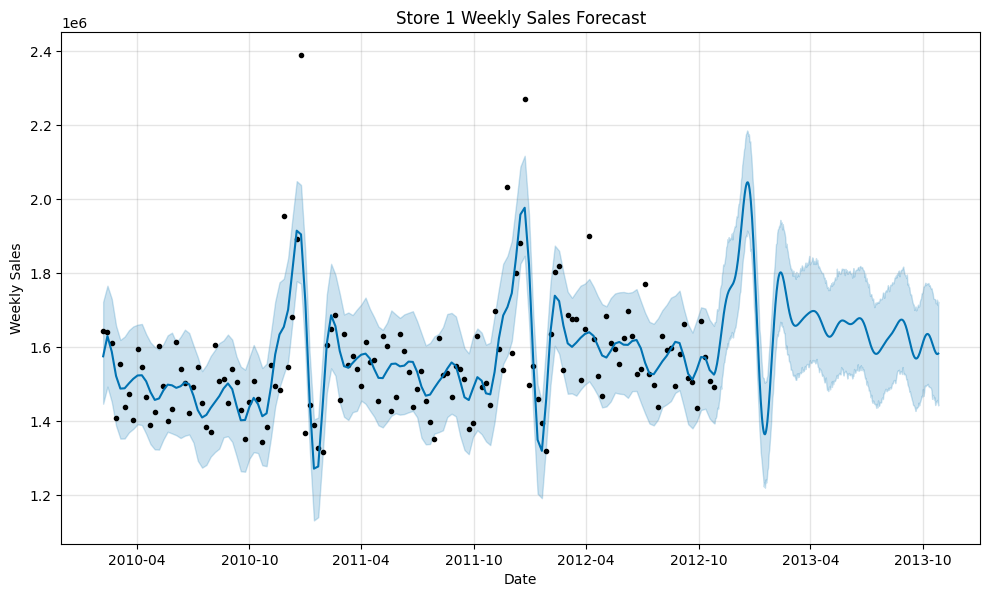

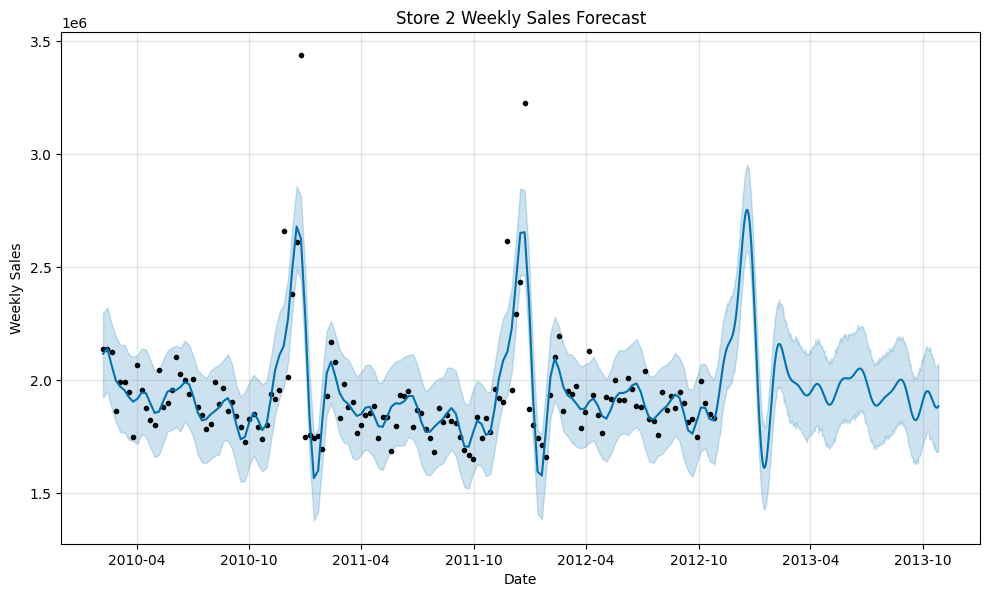

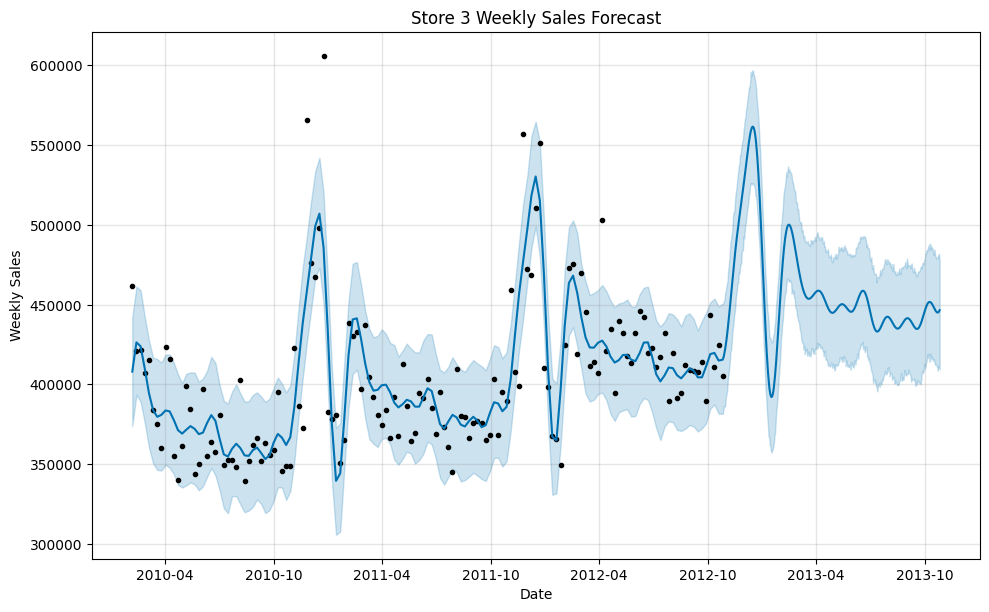

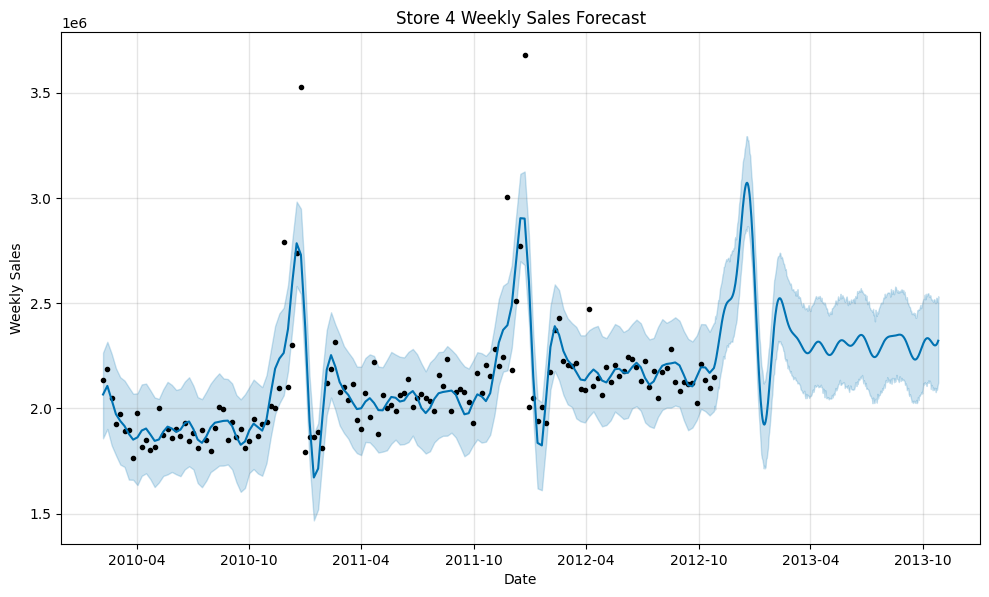

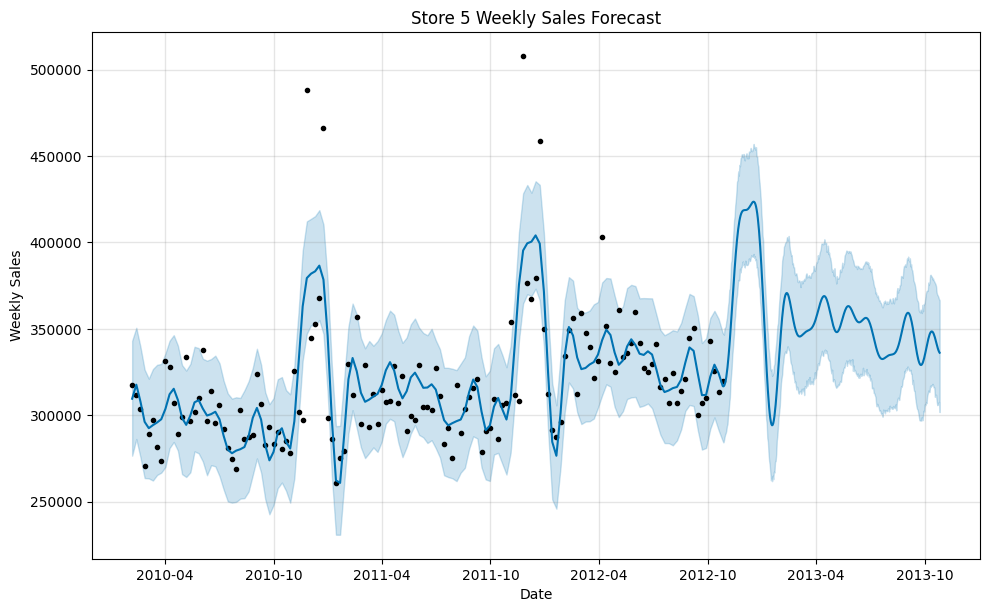

...

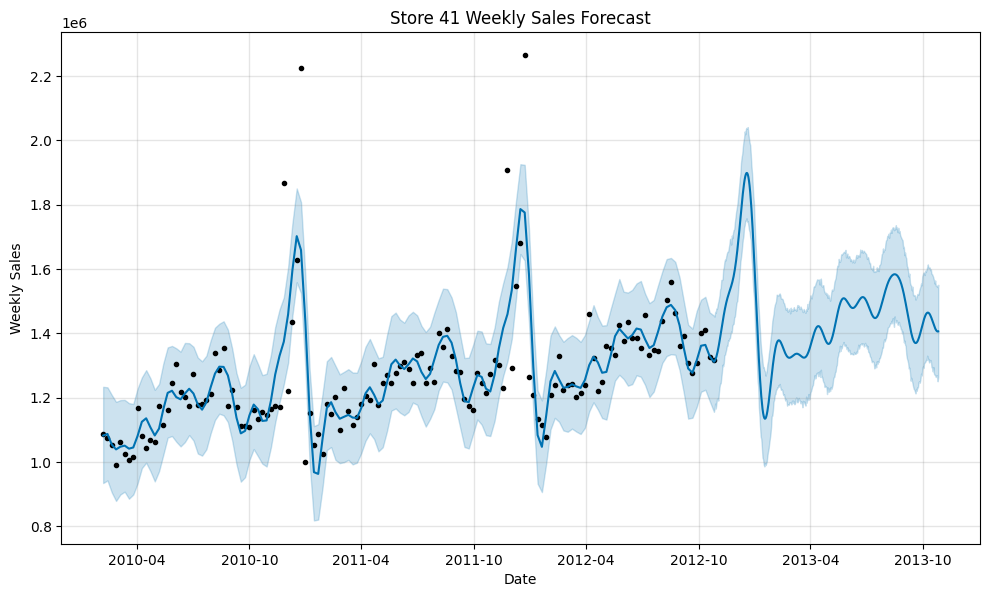

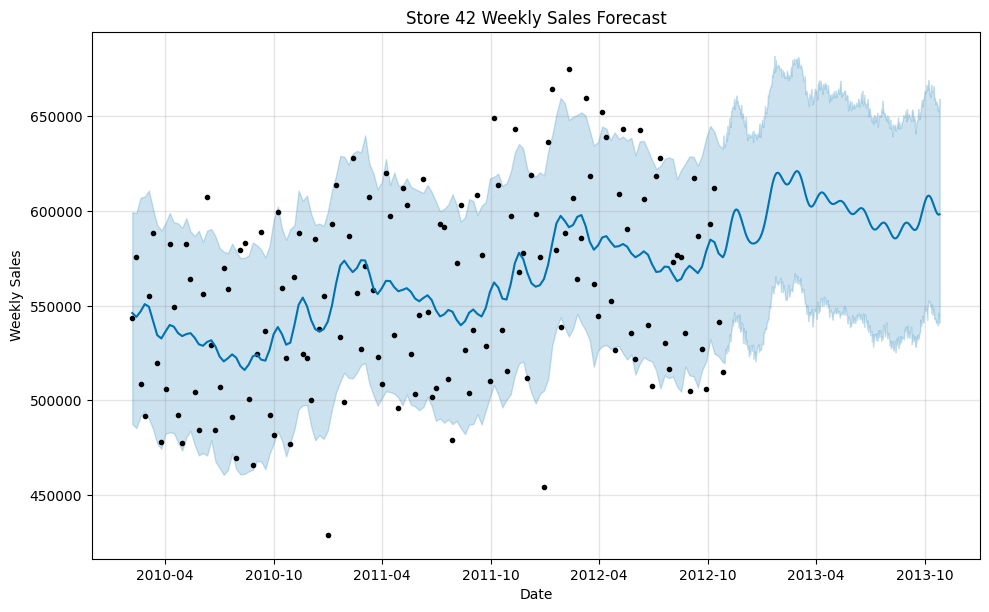

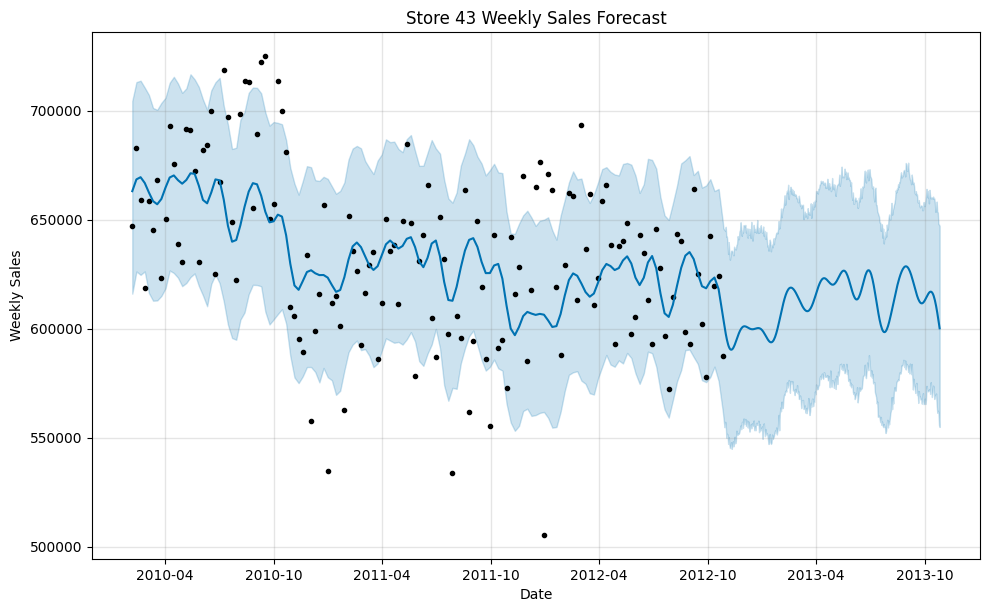

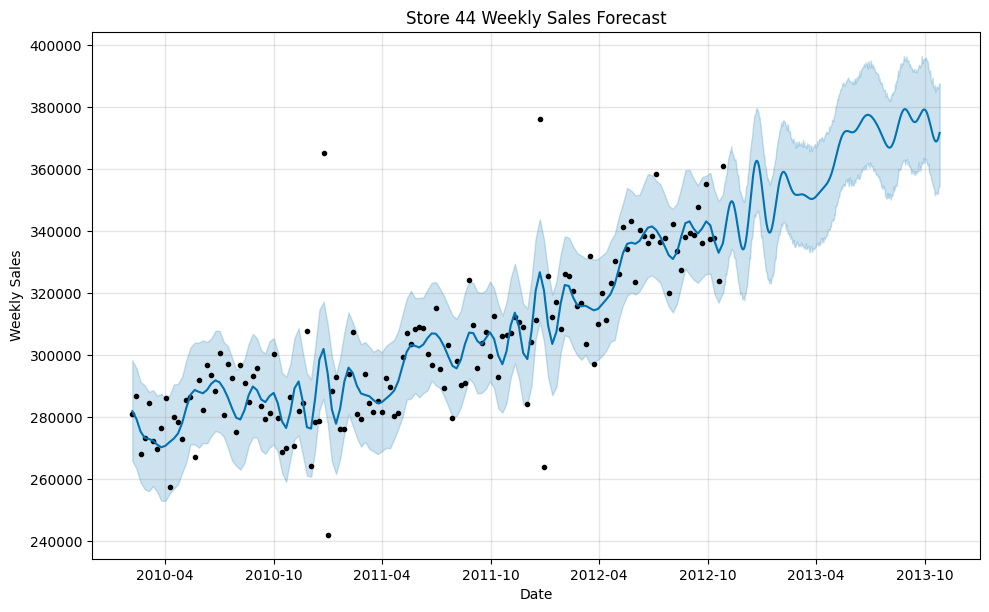

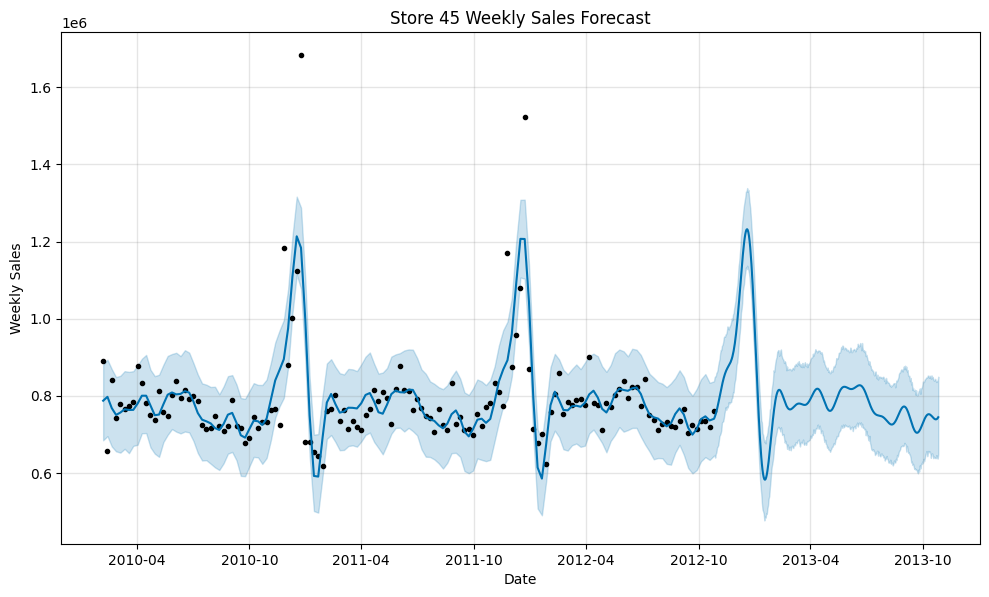

In [6]:
import logging
logging.getLogger('fbprophet').setLevel(logging.WARNING)

# Import and read the combined CSV file for all stores
application_df = pd.read_csv("walmart.csv")

# Function to create and fit Prophet model for a given store
def forecast_store_sales(store_df, store_name):
    # Preprocess the dataset for Prophet
    prophet_df = store_df[['Date', 'Weekly_Sales']]
    prophet_df = prophet_df.rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'})

    # Specify the date format explicitly (e.g., 'DD/MM/YYYY')
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%d-%m-%Y')

    # Create and fit the Prophet model
    model = Prophet()
    model.fit(prophet_df)

    # Create DataFrame for future dates
    future_dates = model.make_future_dataframe(periods=365)  # Forecasting for 1 year (365 days) into the future

    # Make predictions
    forecast = model.predict(future_dates)

    # Visualize the forecast
    fig = model.plot(forecast)
    plt.xlabel('Date')
    plt.ylabel('Weekly Sales')
    plt.title(f'Store {store_name} Weekly Sales Forecast')

    # Save the forecast plot to a file (optional)
    plt.savefig(f"Store {store_name}_forecast.png")

    # Return the forecast DataFrame
    return forecast

# Group data by store identifier (e.g., store) and create forecasts for each store
all_forecasts = []
for store_name, store_df in application_df.groupby('Store'):
    forecast = forecast_store_sales(store_df, store_name)
    all_forecasts.append((store_name, forecast))


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp96argfw6/22rnz3vh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp96argfw6/3wx6u9zr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25317', 'data', 'file=/tmp/tmp96argfw6/22rnz3vh.json', 'init=/tmp/tmp96argfw6/3wx6u9zr.json', 'output', 'file=/tmp/tmp96argfw6/prophet_modelor39rj0q/prophet_model-20230728002511.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
00:25:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
00:25:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonalit

Forecast results have been successfully saved to forecasts.json


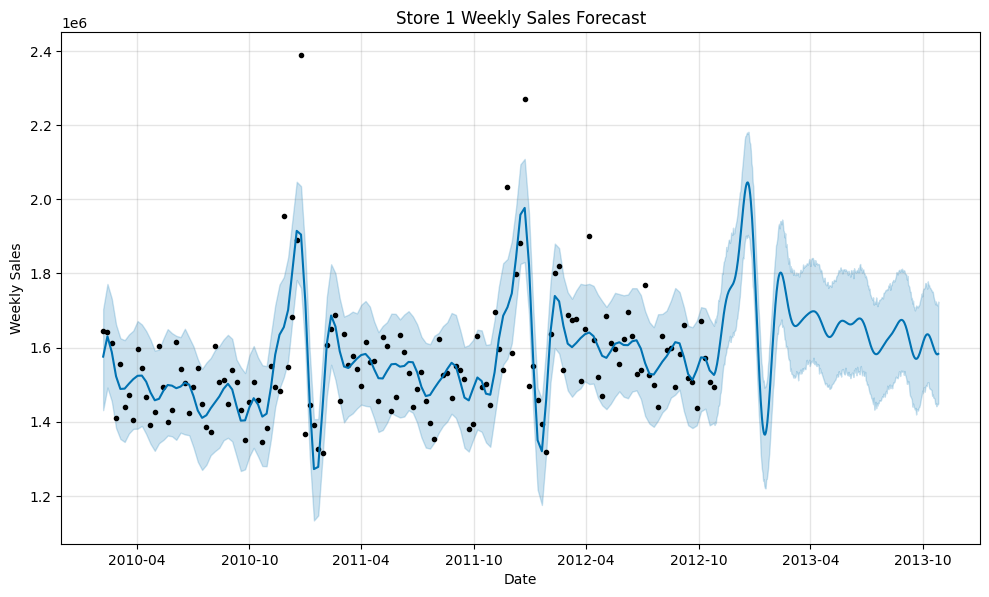

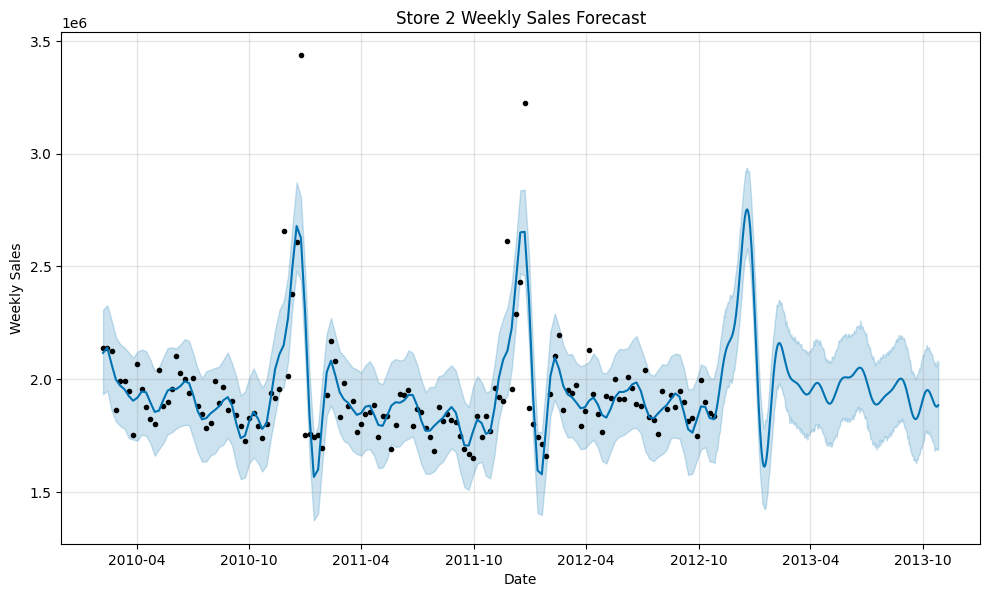

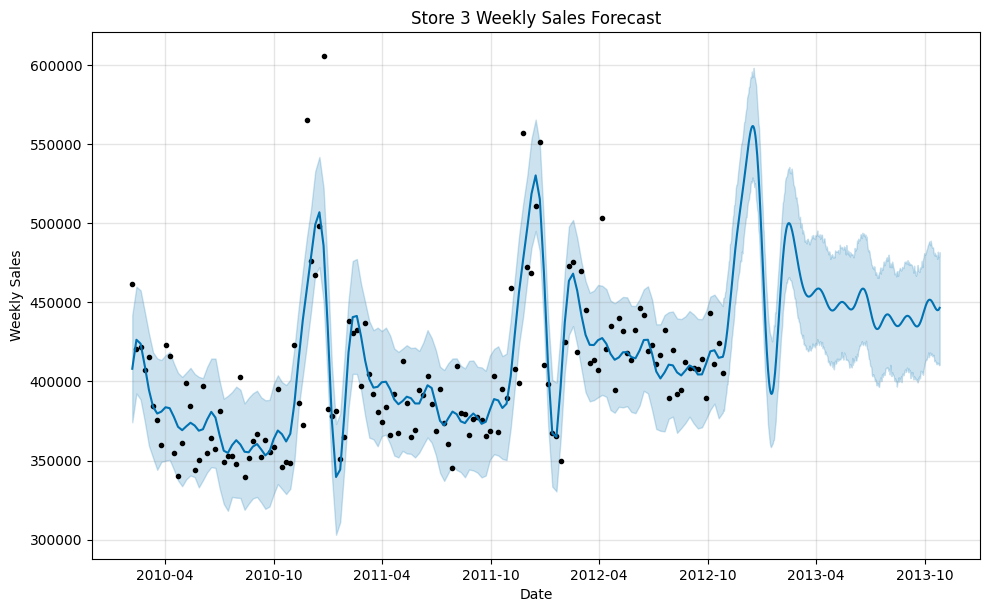

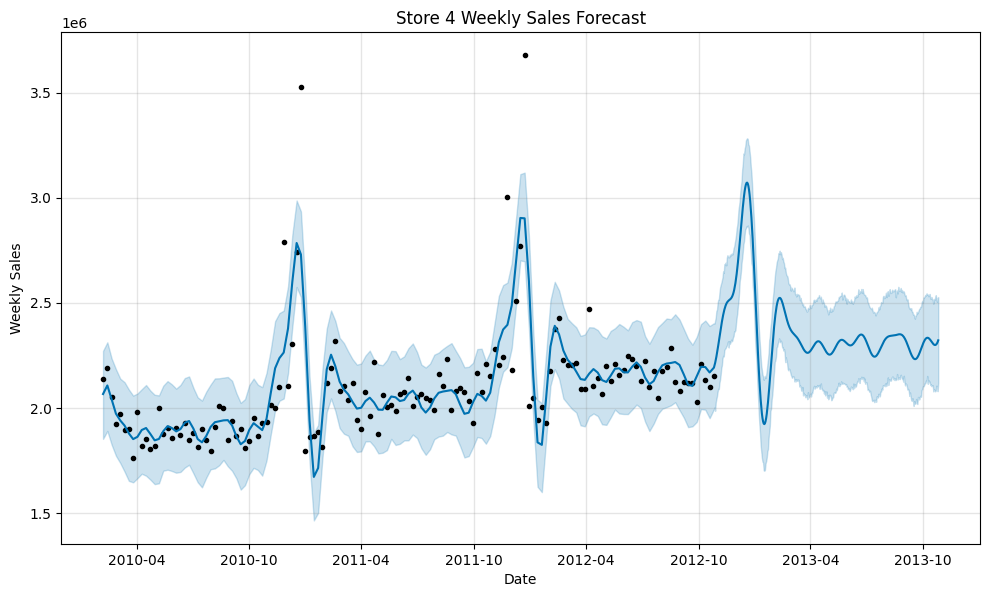

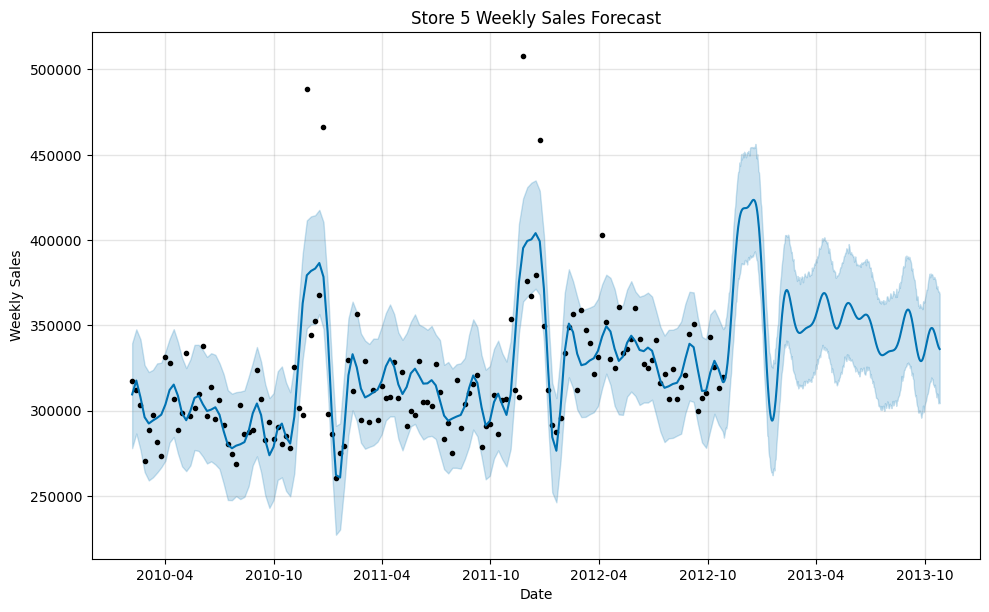

...

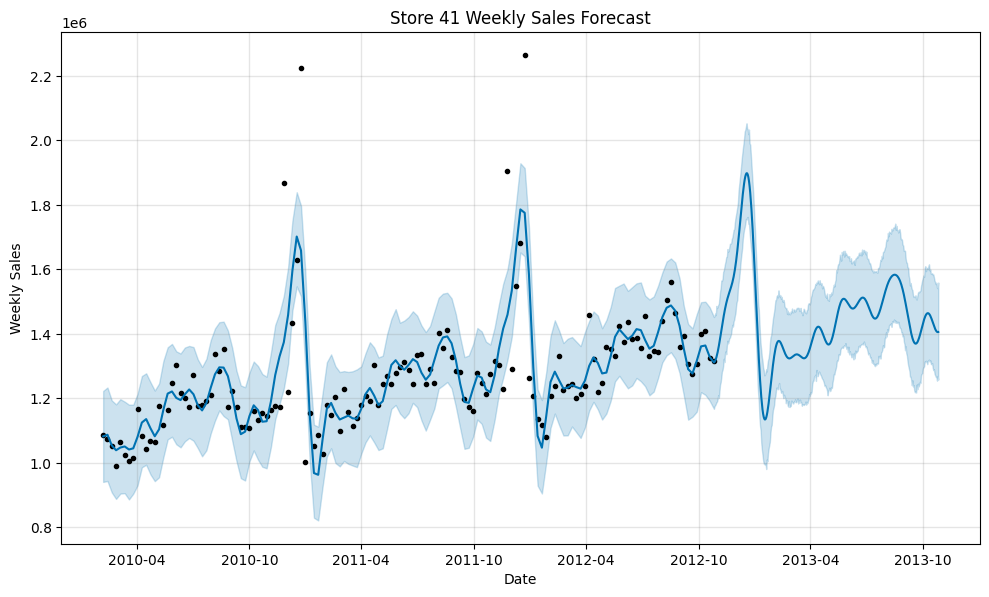

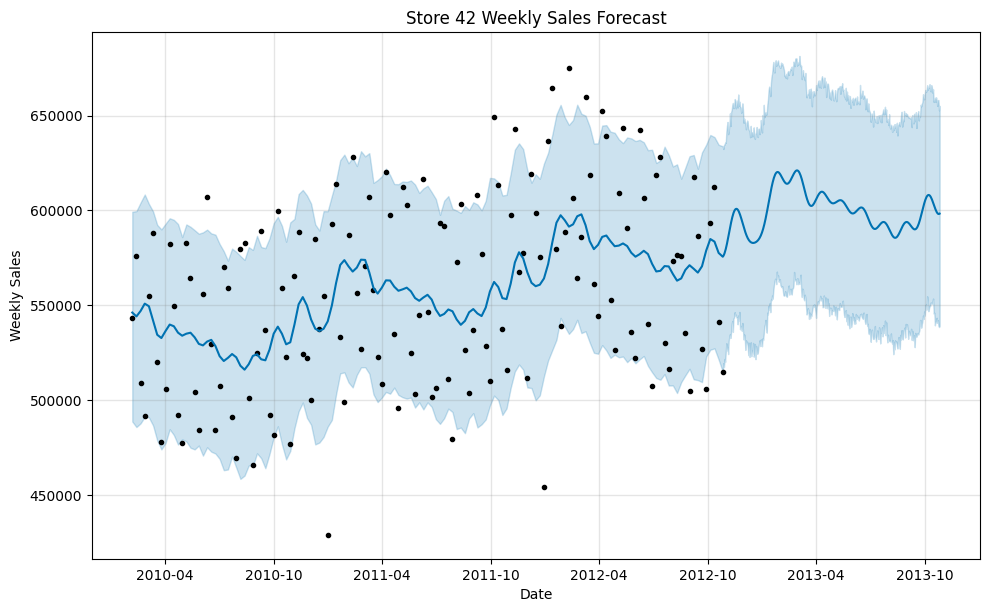

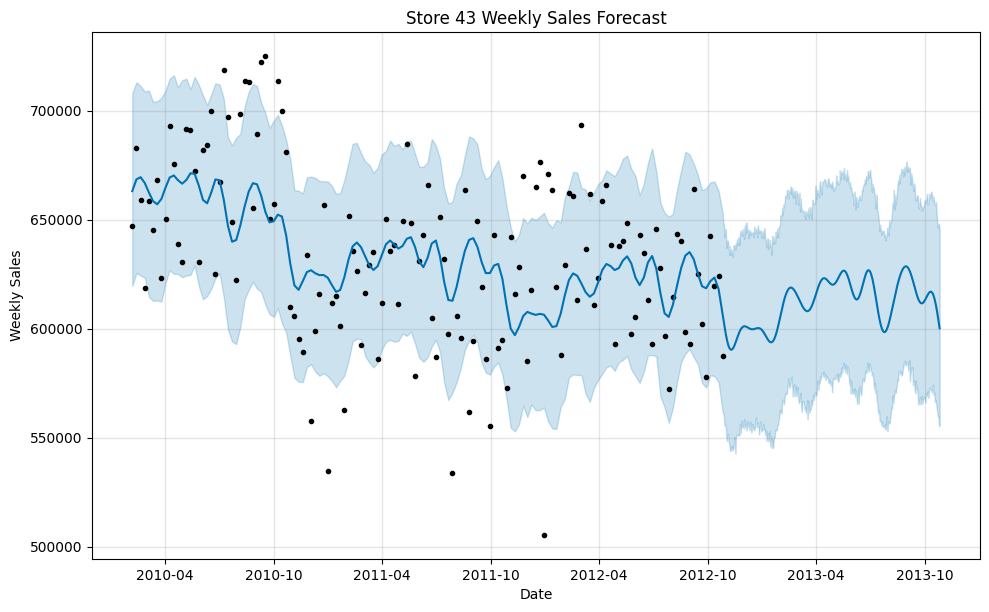

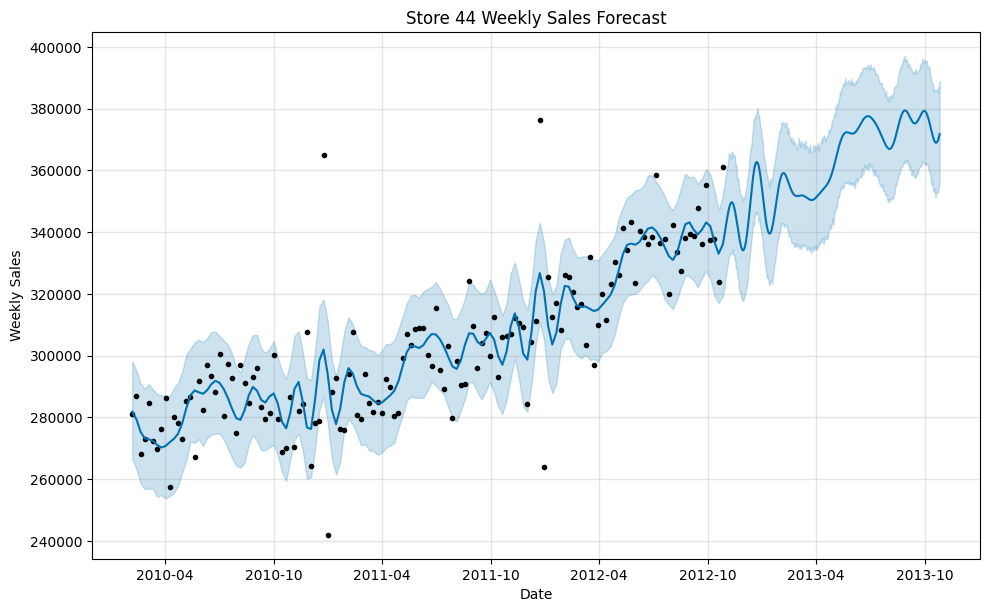

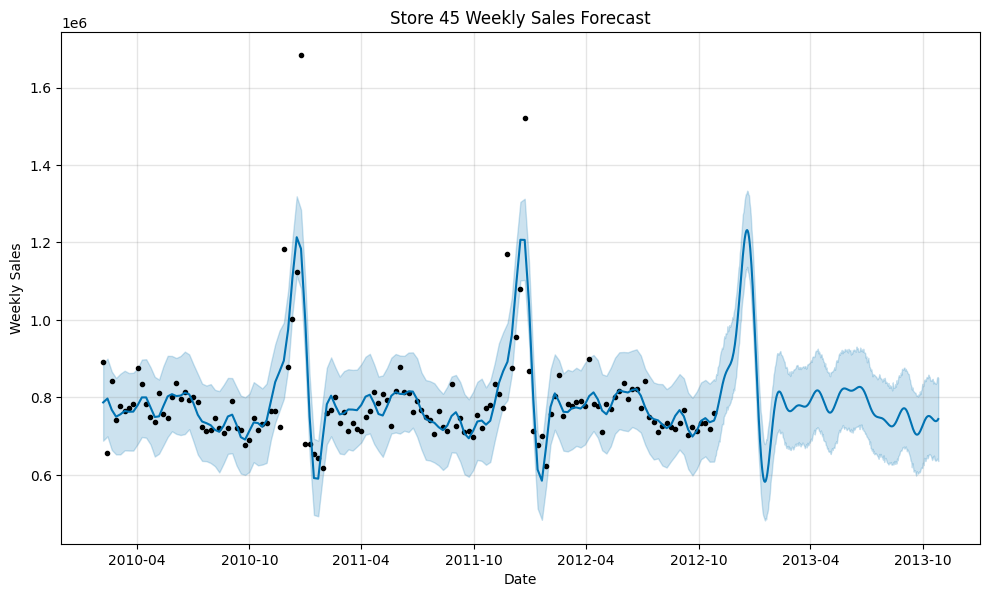

In [7]:
import json

# Function to extract relevant information from the Prophet forecast and create a JSON-friendly dictionary
def forecast_to_json(forecast, store_name):
    forecast_json = {
        'Store': store_name,
        'Forecast': {
            'Dates': forecast['ds'].dt.strftime('%Y-%m-%d').tolist(),
            'Weekly_Sales': forecast['yhat'].tolist(),
            'Lower_Bound': forecast['yhat_lower'].tolist(),
            'Upper_Bound': forecast['yhat_upper'].tolist()
        }
    }
    return forecast_json

# Create a list to store all forecast results in JSON format
all_forecasts_json = []

# Group data by store identifier (e.g., store) and create forecasts for each store
for store_name, store_df in application_df.groupby('Store'):
    forecast = forecast_store_sales(store_df, store_name)
    forecast_json = forecast_to_json(forecast, store_name)
    all_forecasts_json.append(forecast_json)

# Convert the list of forecasts to a JSON-formatted string
json_data = json.dumps(all_forecasts_json, indent=4)

# Specify the file path to save the JSON data
json_file_path = "forecasts.json"

# Save the JSON data to a file
with open(json_file_path, 'w') as json_file:
    json_file.write(json_data)

print("Forecast results have been successfully saved to", json_file_path)
